# 1. Business Understanding

Weather prediction provides important information that organizations/individuals can use to help mitigate weather related losses. Because of the sheer amount of locations that exist across the planet, it is infeasible for people to individually classify the kind of weather occuring in different areas.

The dataset we chose is Weather Image Recognition data from the following Kaggle dataset: https://www.kaggle.com/datasets/jehanbhathena/weather-dataset?resource=download.

This data includes 6862 images of different types of weather spread across 11 different categories: dew, fog/smog, frost, glaze, hail, lightning, rain, rainbow, rime, sandstorm, and snow.

We hope our analysis can help weather organizations understand how to classify different kinds of weather

# 2. Data Preparation

### 2.1 Setting up the data

In [2]:
import numpy as np
from numpy import asarray
import pandas as pd
import os
from PIL import Image # used to read image
from sklearn.decomposition import PCA # used for PCA
import matplotlib.pyplot as plt
from skimage.feature import daisy
import time

In [36]:
# Get all the file names and establish image directory

allfilenames = []
dirList = os.listdir("./")

for root, dirs, files in os.walk('.'):
  for x in range(len(files)):
    files[x] = root[2:] + '_' + files[x]
    allfilenames.append(files[x])
  for image in files:
    if image.endswith((".jpg")):
      pass


In [13]:
# The first item in the file name list is not relevant, so it needs to be popped

allfilenames.pop(0)

'_Analysis.ipynb'

In [14]:
# Generate data paths with labels
data_dir = "ImageDataset"
filepaths = []
labels = []

folds = os.listdir(data_dir)
for fold in folds:
    foldpath = os.path.join(data_dir, fold)
    filelist = os.listdir(foldpath)
    for file in filelist:
        fpath = os.path.join(foldpath, file)
        filepaths.append(fpath)
        labels.append(fold)

# Concatenate data paths with labels into one dataframe
Fseries = pd.Series(filepaths, name= 'filepaths')
Lseries = pd.Series(labels, name='labels')
df = pd.concat([Fseries, Lseries], axis= 1)

In [15]:
# Verify that the images loaded correctly

img = Image.open(df.filepaths[0])

print(img.format)
print(img.size)
print(img.mode)
print()


numpydata = asarray(img)

# <class 'numpy.ndarray'>
print(type(numpydata))

#  shape
print(numpydata.shape)
print()

pilImage = Image.fromarray(numpydata)
print(type(pilImage))

# Let us check  image details
print(pilImage.mode)
print(pilImage.size)
print(pilImage)

JPEG
(400, 283)
RGB

<class 'numpy.ndarray'>
(283, 400, 3)

<class 'PIL.Image.Image'>
RGB
(400, 283)
<PIL.Image.Image image mode=RGB size=400x283 at 0x7F8AD8978DF0>


In [16]:
# Put the images in a list

images = []

for i in df.filepaths:
    if i.endswith((".jpg", ".jpeg", ".png", ".gif")):
        img = Image.open(i)
        img = Image.open(i).convert("L")  #convert image to grayscale
        img = img.resize((100, 100))  #resize images to 100x100 pixels
        images.append(np.array(img))

In [18]:
# Make a dataframe of images and labels

data = pd.DataFrame(
    {'Image': images,
     'Label': allfilenames
    })

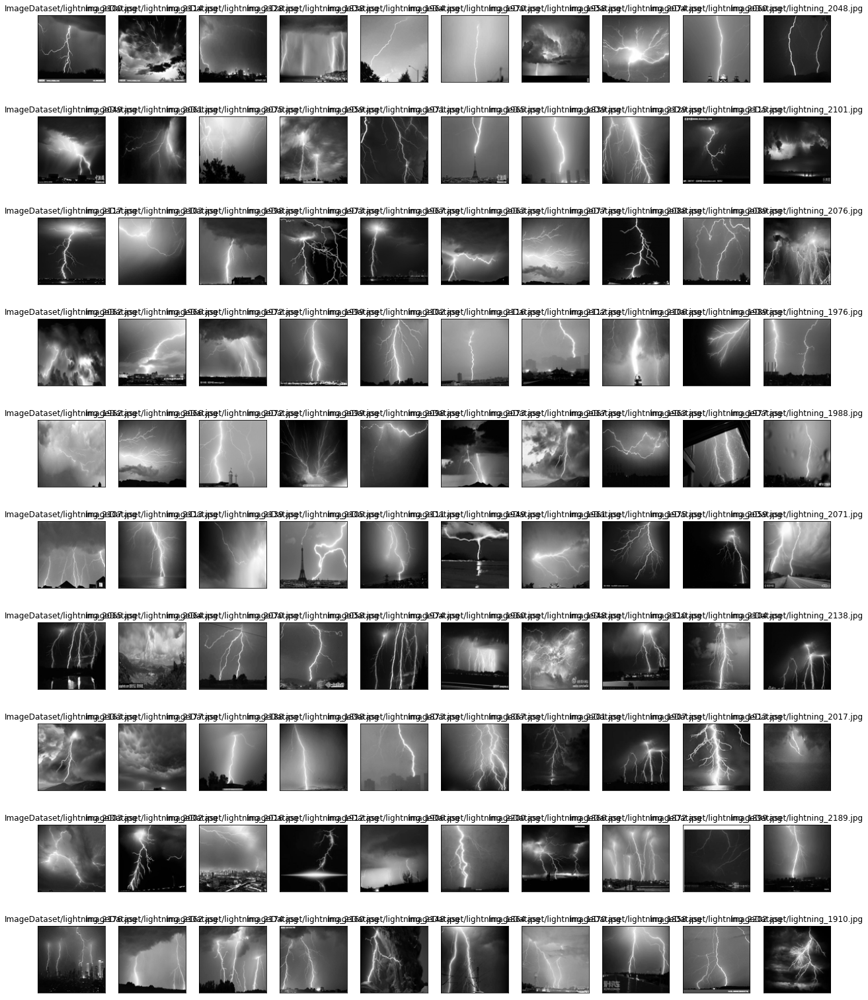

In [19]:
# a helper plotting function

def plot_gallery(images, titles, n_row=10, n_col=10):
    """Helper function to plot a gallery of portraits"""
    plt.figure(figsize=(1.7 * n_col, 2.3 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        plt.imshow(images[i], cmap=plt.cm.gray)
        plt.title(titles[i], size=12)
        plt.xticks(())
        plt.yticks(())

plot_gallery(data['Image'], data['Label'])

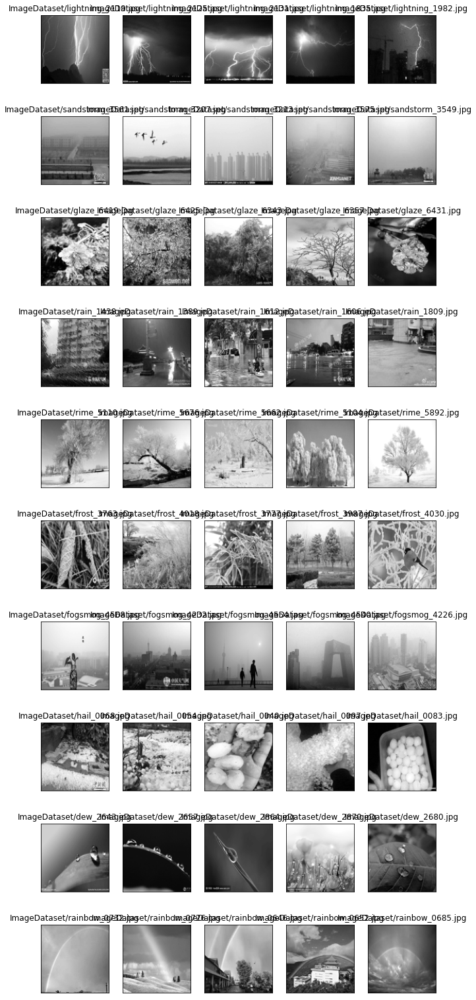

In [21]:
# Prep the images for plotting

images_plot = []
files_plot = []

for x in range(len(data['Label']) - 1):
  if ((data['Label'])[x])[13:16] != ((data['Label'])[x + 1])[13:16]:
    for i in range(5):
      images_plot.append((data['Image'])[x - i])
      files_plot.append((data['Label'])[x - i])

plot_gallery(images_plot, files_plot, 10, 5)

# 3. Data Reduction

lig
Extracting the top 600 eigenfaces from 600 faces
CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 3.81 µs


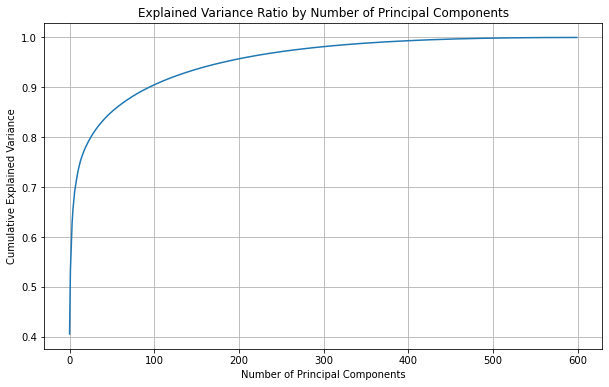

In [22]:

chosen_images = []
chosen_labels = []

print((data['Label'])[1][13:16])

# Only add 60 of each weather type
# Checks the weather type by comparing the first three letters of the string on the path
for x in range(len(data['Label']) - 1):
  if ((data['Label'])[x])[13:16] != ((data['Label'])[x + 1])[13:16]:
    for i in range(60):
      chosen_images.append((data['Image'])[x - i])
      chosen_labels.append((data['Label'])[x - i])


#flatten the resized images
flattened_images = [img.flatten() for img in chosen_images]

#perform PCA
n_components = 600
print("Extracting the top %d eigenfaces from %d faces" % (n_components, len(flattened_images)))

pca = PCA(n_components=n_components, svd_solver="full")
start_time = time.time()
%time 
pca.fit(flattened_images)  # Fit PCA on the flattened images
pca_time = time.time() - start_time
eigenfaces = pca.components_.reshape((n_components, 100, 100))

#plot explained variance
def plot_explained_variance(pca):
    plt.figure(figsize=(10, 6))
    plt.plot(np.cumsum(pca.explained_variance_ratio_))
    plt.xlabel('Number of Principal Components')
    plt.ylabel('Cumulative Explained Variance')
    plt.title('Explained Variance Ratio by Number of Principal Components')
    plt.grid(True)
    plt.show()

plot_explained_variance(pca)

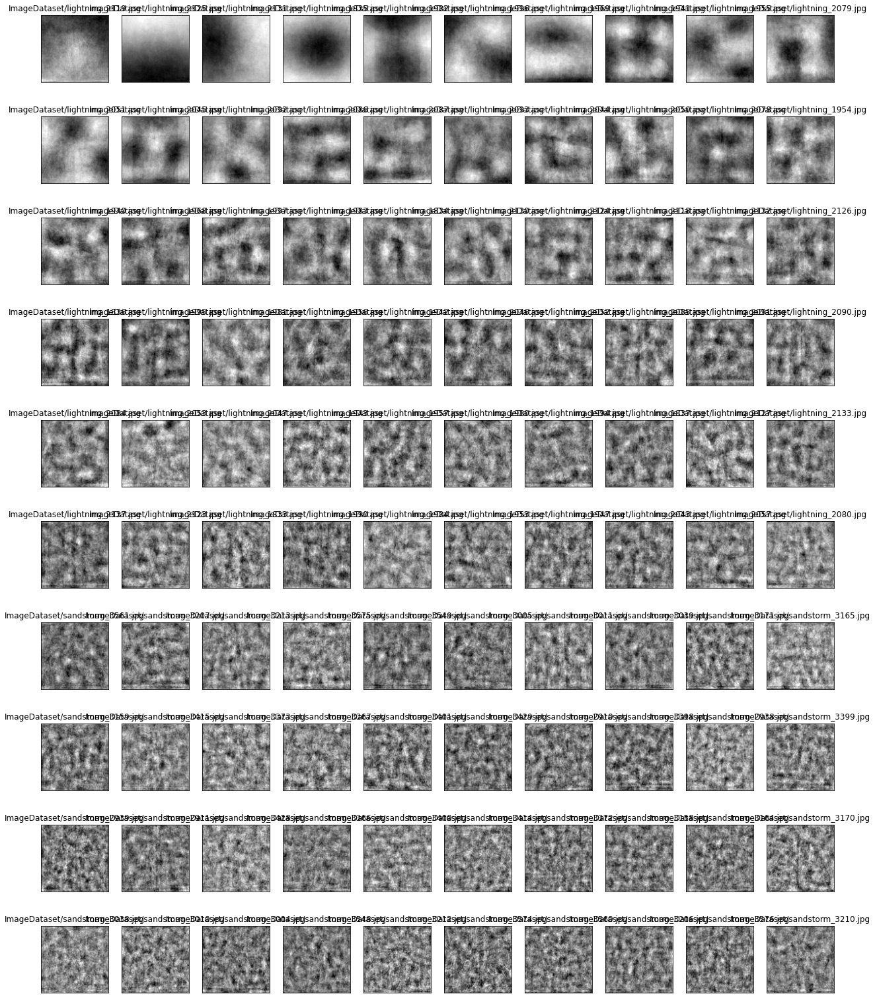

In [23]:
eigenface_titles = ["%s" % chosen_labels[i] for i in range(eigenfaces.shape[0])]
plot_gallery(eigenfaces, eigenface_titles)

## Randomized PCA

Extracting the top 600 eigenfaces from 600 faces
CPU times: user 3 µs, sys: 2 µs, total: 5 µs
Wall time: 12.6 µs


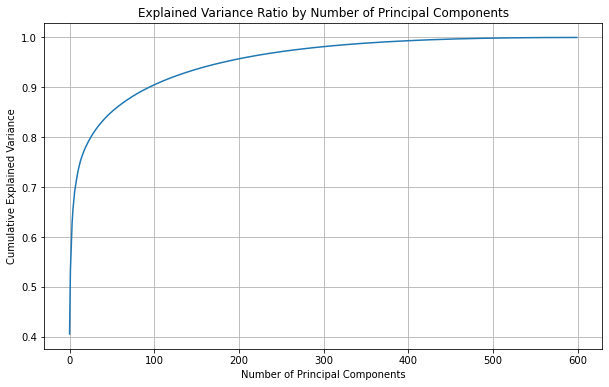

In [24]:
#perform randomized PCA
n_components = 600
print("Extracting the top %d eigenfaces from %d faces" % (n_components, len(flattened_images)))

rpca = PCA(n_components=n_components, svd_solver='randomized')
start_time = time.time()
%time 
rpca.fit(flattened_images)  #fit PCA on the flattened images
rpca_time = time.time() - start_time
eigenfaces = rpca.components_.reshape((n_components, 100, 100))

plot_explained_variance(rpca)

In [26]:
#Computation Time Comparison
print("Computation Time Comparison (in ms):")
print("PCA:", pca_time)
print("Randomized PCA:", rpca_time)
print("Difference: ", rpca_time-pca_time)

Computation Time Comparison (in ms):
PCA: 1.065688133239746
Randomized PCA: 2.4826250076293945
Difference:  1.4169368743896484


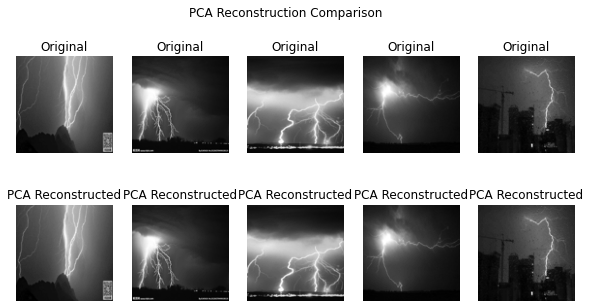

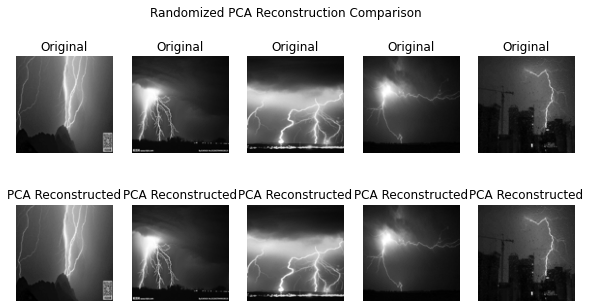

In [27]:
#Quality of Reconstruction Comparison

def plot_reconstructed_images(images, title):
    plt.figure(figsize=(10, 5))
    for i in range(5):
        plt.subplot(2, 5, i + 1)
        plt.imshow(images[i].reshape(100, 100), cmap='gray')
        plt.title('Original')
        plt.axis('off')

        plt.subplot(2, 5, i + 6)
        reconstructed_image = pca.inverse_transform(pca.transform(images[i].reshape(1, -1)))
        plt.imshow(reconstructed_image.reshape(100, 100), cmap='gray')
        plt.title('PCA Reconstructed')
        plt.axis('off')
    plt.suptitle(title)
    plt.show()


plot_reconstructed_images(flattened_images, 'PCA Reconstruction Comparison')
plot_reconstructed_images(flattened_images, 'Randomized PCA Reconstruction Comparison')

## Daisy

In [28]:
# Flatten the images to be used for Daisy

y_images = [img.flatten() for img in images]
cut_images = [img.flatten() for img in images_plot]

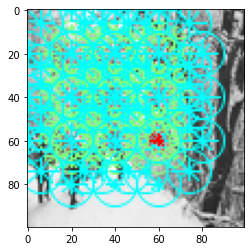

In [29]:
# Sample Daisy plot

features, img_desc = daisy(img,
                           step=20,
                           radius=20,
                           rings=2,
                           histograms=8,
                           orientations=8,
                           visualize=True)
plt.imshow(img_desc)
plt.grid(False)
plt.show()

In [31]:
# Run Daisy on the a sample image and output the dimensions 

features = daisy(img, step=10, radius=20, rings=2, histograms=8, orientations=4, visualize=False)
print(features.shape)
print(features.shape[0]*features.shape[1]*features.shape[2])

(6, 6, 68)
2448


In [32]:
# Run Daisy on all the iamges

def apply_daisy(row,shape):
    feat = daisy(row.reshape(shape), step=10, radius=20,
                 rings=2, histograms=8, orientations=4,
                 visualize=False)
    return feat.reshape((-1))

%time 
test_feature = apply_daisy(y_images[3],(100,100))
test_feature.shape

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 4.05 µs


(2448,)

In [33]:
%time 
daisy_features = np.apply_along_axis(apply_daisy, 1, cut_images, (100,100))
print(daisy_features.shape)

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 3.81 µs
(50, 2448)


CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 5.25 µs


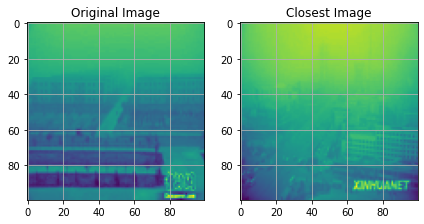

In [34]:
# Closest image comparison from Daisy

from sklearn.metrics.pairwise import pairwise_distances
# find the pairwise distance between all the different image features
%time 
dist_matrix = pairwise_distances(daisy_features)

import copy
# find closest image to current image
idx1 = 5
distances = copy.deepcopy(dist_matrix[idx1,:])
distances[idx1] = np.infty # dont pick the same image!
idx2 = np.argmin(distances)

plt.figure(figsize=(7,10))
plt.subplot(1,2,1)
plt.imshow(cut_images[idx1].reshape((100,100)))
plt.title("Original Image")
plt.grid()

plt.subplot(1,2,2)
plt.imshow(cut_images[idx2].reshape((100,100)))
plt.title("Closest Image")
plt.grid()

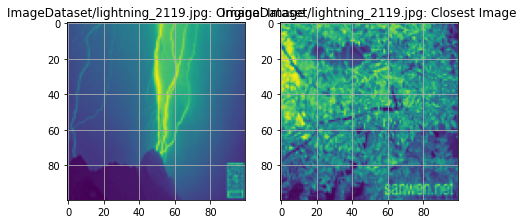

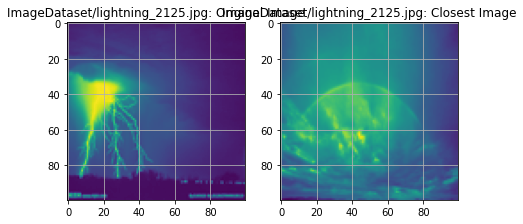

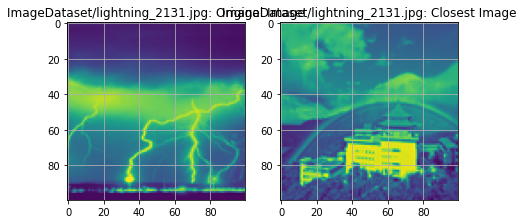

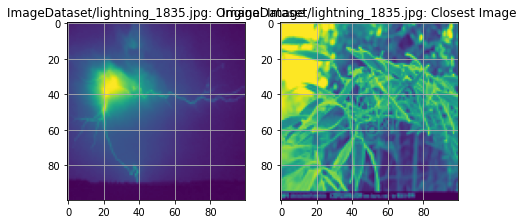

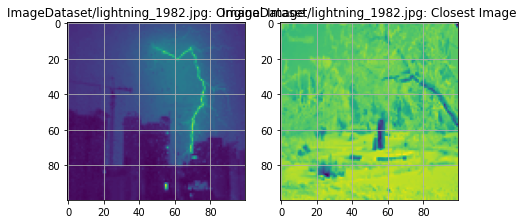

...

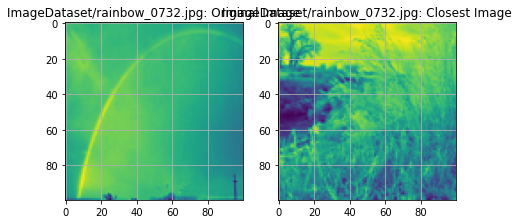

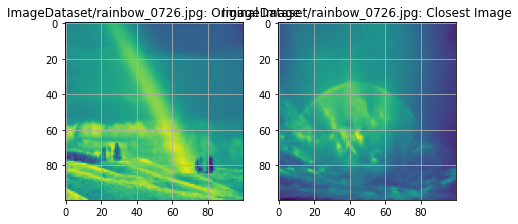

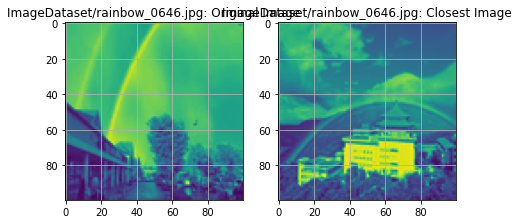

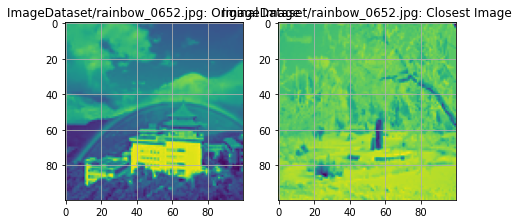

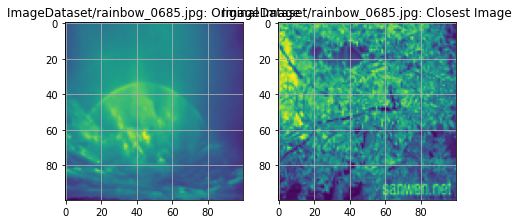

In [77]:
daisy_imgs = [img.flatten() for img in images_plot]

for x in range(len(daisy_imgs)):
  idx1 = x
  distances = copy.deepcopy(dist_matrix[idx1,:])
  distances[idx1] = np.infty # dont pick the same image!
  idx2 = np.argmin(distances)

  plt.figure(figsize=(7,10))
  plt.subplot(1,2,1)
  plt.imshow(cut_images[idx1].reshape((100,100)))
  plt.title(files_plot[x] + ": Original Image")
  plt.grid()

  plt.subplot(1,2,2)
  plt.imshow(cut_images[idx2].reshape((100,100)))
  plt.title(files_plot[x] + ": Closest Image")
  plt.grid()

  plt.show()